Make J-plot from SOHO/LASCO C3 images to track the speed of a solar feature

In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import UnivariateSpline
import astropy.io.fits as fits
import astropy.units as u
# from astropy import constants as const
from astropy.coordinates import SkyCoord
import sunpy.map
from PIL import Image
import matplotlib.colors as colors
from astropy.visualization import ImageNormalize, SqrtStretch, LogStretch
from scipy import stats
import sunpy.sun.constants as const

plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 100
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'white'

data_dir = '/home/mnedal/data'
savedir = '/home/mnedal/repos/dias_work'

In [2]:
detector = 'C3'
os.makedirs(f'{savedir}/jplots/lasco_{detector}/bezier', exist_ok=True)

In [3]:
def split_datetime(start=None, end=None):
    START_DATE, START_TIME = start.split('T')
    END_DATE, END_TIME = end.split('T')

    START_YEAR, START_MONTH, START_DAY = START_DATE.split('-')
    END_YEAR, END_MONTH, END_DAY = END_DATE.split('-')

    START_HOUR, START_MINUTE, START_SECOND = START_TIME.split(':')
    END_HOUR, END_MINUTE, END_SECOND = END_TIME.split(':')

    datetime_dict = {
        'start_year': START_YEAR,
        'start_month': START_MONTH,
        'start_day': START_DAY,
        'start_hour': START_HOUR,
        'start_minute': START_MINUTE,
        'start_second': START_SECOND,
        
        'end_year': END_YEAR,
        'end_month': END_MONTH,
        'end_day': END_DAY,
        'end_hour': END_HOUR,
        'end_minute': END_MINUTE,
        'end_second': END_SECOND
    }
    return datetime_dict




def plot_line(angle_deg=None, length=None, map_obj=None):
    """
    Plot a straight line at an angle in degrees from the solar West.
    """
    angle_rad = np.deg2rad(angle_deg)
    
    # Define the length of the line (in arcseconds)
    line_length = length * u.arcsec
    
    # Define the center point of the line (e.g., the center of the Sun)
    center = SkyCoord(0*u.arcsec, 0*u.arcsec, frame=map_obj.coordinate_frame)
    
    # Calculate the start and end points of the line
    start_point = SkyCoord(center.Tx, center.Ty, frame=map_obj.coordinate_frame)
    end_point   = SkyCoord(center.Tx + line_length * np.cos(angle_rad), 
                           center.Ty + line_length * np.sin(angle_rad),
                           frame=map_obj.coordinate_frame)
    
    line = SkyCoord([start_point, end_point])
    return line



def generate_centered_list(center, difference, num_elements):
    """
    Generate a list of numbers centered around a given number with a specified difference
    between consecutive numbers.

    Parameters:
    center (int): The central number around which the list is generated.
    difference (int): The difference between consecutive numbers in the list.
    num_elements (int): The number of elements before and after the central number.

    Returns:
    list: A list of numbers centered around the specified central number.
    """
    return [center + difference * i for i in range(-num_elements, num_elements + 1)]



def remove_redundant_maps(maps):
    """
    Remove redundant SunPy maps, keeping only one map per unique timestamp.

    Parameters:
    maps (list): List of SunPy Map objects. Each map is expected to have a 'date-obs' 
                 key in its metadata that provides the observation timestamp.

    Returns:
    list: A list of unique SunPy Map objects, one per unique timestamp.
    
    Example:
    >>> unique_maps = remove_redundant_maps(list_of_sunpy_maps)
    """
    unique_maps = {}
    for m in maps:
        timestamp = m.latex_name
        if timestamp not in unique_maps:
            unique_maps[timestamp] = m
    return list(unique_maps.values())



def apply_runratio(maps):
    """
    Apply running-ratio image technique on EUV images.
    See: https://iopscience.iop.org/article/10.1088/0004-637X/750/2/134/pdf
        Inputs: list of EUV sunpy maps.
        Output: sequence of run-ratio sunpy maps.
    """
    runratio = [m / prev_m.quantity for m, prev_m in zip(maps[1:], maps[:-1])]
    m_seq_runratio = sunpy.map.Map(runratio, sequence=True)
    
    for m in m_seq_runratio:
        m.data[np.isnan(m.data)] = 1
        m.plot_settings['norm'] = colors.Normalize(vmin=0, vmax=2)
        m.plot_settings['cmap'] = 'Greys_r'
    
    return m_seq_runratio



def enhance_contrast(image, vmin, vmax):
    """
    Enhance contrast by clipping and normalization.
    """
    image_clipped = np.clip(image, vmin, vmax)
    image_normalized = (image_clipped - vmin) / (vmax - vmin)
    return image_normalized



def calculate_percentiles(image, lower_percentile=3, upper_percentile=97):
    """
    Calculate vmin and vmax based on the 1st and 99th percentiles.
    """
    vmin = np.percentile(image, lower_percentile)
    vmax = np.percentile(image, upper_percentile)
    return vmin, vmax



def round_obstime(time=None):
    """
    Round the observation time to put it in the image title.
    Input : str, time (HH:MM:SS.sss)
    Output: str, datetime (YYYY-mm-DD HH:MM:SS)
    """
    from datetime import datetime, timedelta

    original_time_str = time

    # Convert the original time string to a datetime object
    original_time = datetime.strptime(original_time_str, '%H:%M:%S.%f')

    # Round the time to the nearest second
    rounded_time = original_time + timedelta(seconds=round(original_time.microsecond / 1e6))

    # Format the rounded time as 'HH:MM:SS'
    rounded_time_str = rounded_time.strftime('%H:%M:%S')
    
    return rounded_time_str



def load_lasco(start=None, end=None, detector='C2'):
    """
    Load SOHO/LASCO C2 or C3 images as sunpy maps.
    """
    dt_dict = split_datetime(start=start, end=end)
    data = sorted(glob.glob(f"{data_dir}/LASCO_{detector}/LASCO_{detector}_{dt_dict['start_year']}{dt_dict['start_month']}{dt_dict['start_day']}*.jp2"))
    
    start_file_to_find = f"{data_dir}/LASCO_{detector}/LASCO_{detector}_{dt_dict['end_year']}{dt_dict['start_month']}{dt_dict['start_day']}T{dt_dict['start_hour']}{dt_dict['start_minute']}.jp2"
    end_file_to_find = f"{data_dir}/LASCO_{detector}/LASCO_{detector}_{dt_dict['end_year']}{dt_dict['end_month']}{dt_dict['end_day']}T{dt_dict['end_hour']}{dt_dict['end_minute']}.jp2"
    
    idx1 = data.index(start_file_to_find)
    idx2 = data.index(end_file_to_find)
    chosen_files = data[idx1:idx2]
    
    map_objects = []
    for i, file in enumerate(chosen_files):
        m = sunpy.map.Map(file)
        m.meta['bunit'] = 'ct' # a workaround for C2 and C3 jp2 images
        m.plot_settings['norm'] = ImageNormalize(vmin=0, vmax=250)
        map_objects.append(m)
        print(f'LASCO {detector} image {i} is done')
    return map_objects



def draw_bezier(x1=0, y1=0, x2=0, y2=0, control=[0,0]):
    """
    Draw a Bezier curve using the given control points.
    The curve will be drawn from the point (x1, y1) to the point
    (x2, y2) using the control points (control[0], control[1]).
    """
    A = np.array([x2, y2])
    B = np.array(control)
    C = np.array([x1, y1])

    A = A.reshape(2,1)
    B = B.reshape(2,1)
    C = C.reshape(2,1)
    
    t = np.arange(0, 1, 0.04).reshape(1,-1)
    
    # length = len(df.index)
    # t = np.linspace(0, 1, length).reshape(1,-1)
    # t = np.arange(0, length, 1).reshape(1,-1)
    
    P0 = A * t + (1 - t) * B
    P1 = B * t + (1 - t) * C
    Pfinal = P0 * t + (1 - t) * P1

    return Pfinal


def extract_bezier_values(array, x1, y1, x2, y2, control):
    """
    Extract the values of a Bezier curve at the given control points.
    The curve will be drawn from the point (x1, y1) to the point
    (x2, y2) using the control points (control[0], control[1])
    """
    Pfinal = draw_bezier(x1, y1, x2, y2, control)
    x_coords = np.round(Pfinal[0, :]).astype(int)
    y_coords = np.round(Pfinal[1, :]).astype(int)

    # Clip the coordinates to stay within array bounds
    x_coords = np.clip(x_coords, 0, array.shape[1] - 1)
    y_coords = np.clip(y_coords, 0, array.shape[0] - 1)

    # Extract values along the Bézier curve
    bezier_values = array[y_coords, x_coords]
    
    return bezier_values, x_coords, y_coords



# def extract_bezier_values(array, x1, y1, x2, y2, control):
#     """
#     Extract the values of a Bezier curve at the given control points.
#     The curve will be drawn from the point (x1, y1) to the point
#     (x2, y2) using the control points (control[0], control[1])
#     """
#     Pfinal = draw_bezier(x1, y1, x2, y2, control)
#     x_coords = Pfinal[0, :]  # Keep as floating-point
#     y_coords = Pfinal[1, :]  # Keep as floating-point

#     # Clip the coordinates to stay within array bounds
#     x_coords_int = np.clip(np.round(x_coords).astype(int), 0, array.shape[1] - 1)
#     y_coords_int = np.clip(np.round(y_coords).astype(int), 0, array.shape[0] - 1)

#     # Extract values along the Bézier curve
#     bezier_values = array[y_coords_int, x_coords_int]
    
#     return bezier_values, x_coords, y_coords



def generate_number_list(center, offset, count):
    """
    Generate a list of numbers around a given center number.

    Parameters:
    center (int or float): The central number of the list.
    offset (int or float): The increment by which numbers are spaced from the center.
    count (int): The number of numbers to include on each side of the center number.

    Returns:
    list: A list of numbers around the given center.

    Example usage:
        center_number = 0
        offset_value = 2
        count_around = 3
        number_list = generate_number_list(center_number, offset_value, count_around)
        print(number_list)
        [-6, -4, -2, 0, 2, 4, 6]
    """
    return [center + offset * i for i in range(-count, count + 1)]



def compute_standard_error(values_list):
    values_array = np.array(values_list)
    mean_values = np.mean(values_array, axis=0)
    standard_error = np.std(values_array, axis=0, ddof=1) / np.sqrt(values_array.shape[0])
    return mean_values, standard_error

In [4]:
lasco_c3_map_objects = load_lasco(start='2024-05-14T17:45:00', end='2024-05-14T23:59:59', detector='C3')

LASCO C3 image 0 is done
LASCO C3 image 1 is done
LASCO C3 image 2 is done
LASCO C3 image 3 is done
LASCO C3 image 4 is done
LASCO C3 image 5 is done
LASCO C3 image 6 is done
LASCO C3 image 7 is done
LASCO C3 image 8 is done
LASCO C3 image 9 is done
LASCO C3 image 10 is done
LASCO C3 image 11 is done
LASCO C3 image 12 is done
LASCO C3 image 13 is done
LASCO C3 image 14 is done
LASCO C3 image 15 is done
LASCO C3 image 16 is done
LASCO C3 image 17 is done
LASCO C3 image 18 is done
LASCO C3 image 19 is done
LASCO C3 image 20 is done
LASCO C3 image 21 is done
LASCO C3 image 22 is done
LASCO C3 image 23 is done
LASCO C3 image 24 is done
LASCO C3 image 25 is done
LASCO C3 image 26 is done
LASCO C3 image 27 is done
LASCO C3 image 28 is done
LASCO C3 image 29 is done
LASCO C3 image 30 is done
LASCO C3 image 31 is done
LASCO C3 image 32 is done
LASCO C3 image 33 is done
LASCO C3 image 34 is done
LASCO C3 image 35 is done
LASCO C3 image 36 is done
LASCO C3 image 37 is done
LASCO C3 image 38 is d

In [5]:
# remove redundant images
clean_maps_c3 = remove_redundant_maps(lasco_c3_map_objects)

print(f'Before:\nLASCO C3: {len(lasco_c3_map_objects)} images\n')
print(f'After:\nLASCO C3: {len(clean_maps_c3)} images')

Before:
LASCO C3: 374 images

After:
LASCO C3: 29 images


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


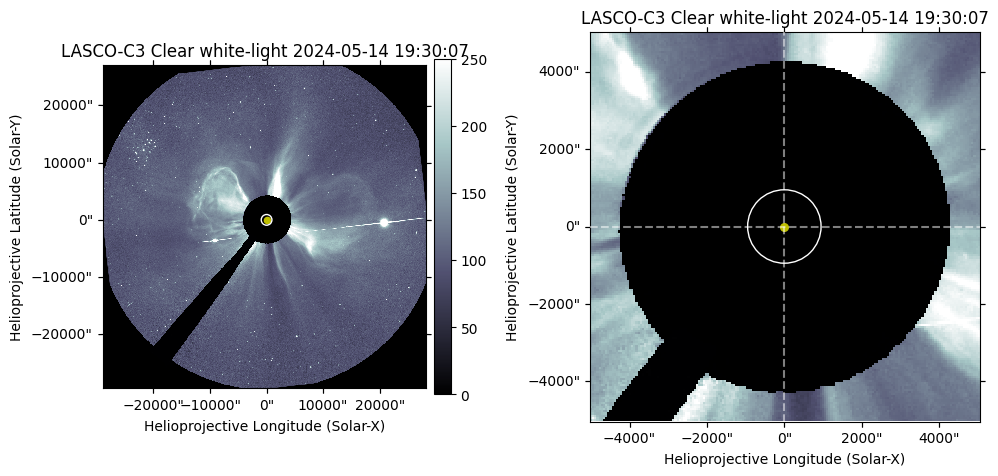

In [6]:
# Test plot ...
fig = plt.figure(figsize=[10,5])

m = clean_maps_c3[9]
ax = fig.add_subplot(121, projection=m)
img = m.plot(axes=ax)
m.draw_limb()
pixel_coords = m.wcs.world_to_pixel(SkyCoord(0*u.arcsec, 0*u.arcsec, frame=m.coordinate_frame))
x_pixel, y_pixel = pixel_coords
ax.scatter(x_pixel, y_pixel, c='y', s=20)
ax.grid(False)
plt.colorbar(img, pad=0.02, shrink=0.8)

m = clean_maps_c3[9]
crop_length = 5000
top_right = SkyCoord(crop_length * u.arcsec, crop_length * u.arcsec, frame=m.coordinate_frame)
bottom_left = SkyCoord(-crop_length * u.arcsec, -crop_length * u.arcsec, frame=m.coordinate_frame)
submap = m.submap(bottom_left, top_right=top_right)
ax = fig.add_subplot(122, projection=submap)
submap.plot(axes=ax)
submap.draw_limb()
pixel_coords = submap.wcs.world_to_pixel(SkyCoord(0*u.arcsec, 0*u.arcsec, frame=submap.coordinate_frame))
x_pixel, y_pixel = pixel_coords
ax.scatter(x_pixel, y_pixel, c='y', s=30)
ax.axvline(x=x_pixel, color='w', linestyle='--', alpha=0.5)
ax.axhline(y=y_pixel, color='w', linestyle='--', alpha=0.5)
ax.grid(False)

fig.tight_layout()
plt.show()

In [7]:
# make run-diff maps
m_seq_runratio_c3 = apply_runratio(clean_maps_c3)

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


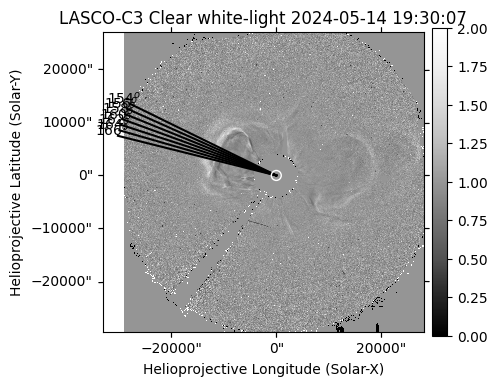

In [8]:
slits = True
centered_list = generate_centered_list(160, 2, 3)

fig = plt.figure(figsize=[5,5])

m = m_seq_runratio_c3[8]
ax = fig.add_subplot(111, projection=m)
img = m.plot(axes=ax)
m.draw_limb()
ax.grid(False)
plt.colorbar(img, pad=0.02, shrink=0.8)

if slits:
    for value in centered_list:
        line = plot_line(angle_deg=value, length=31000, map_obj=m)
        ax.plot_coord(line, color='black')
        
        # Plot the number at the end of the line
        # Convert SkyCoord to pixel coordinates for plotting text
        line_lon, line_lat = line.Tx, line.Ty
        end_point_pixel = m.world_to_pixel(SkyCoord(line_lon[1], line_lat[1], frame=m.coordinate_frame))
        
        # Display the number at the end point
        ax.text(end_point_pixel.x.value - 20, end_point_pixel.y.value + 20, f'{value}$^o$',
                color='black', fontsize=10, ha='center', va='center')
plt.show()

## J-Maps for LASCO C3

Working on map 0 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


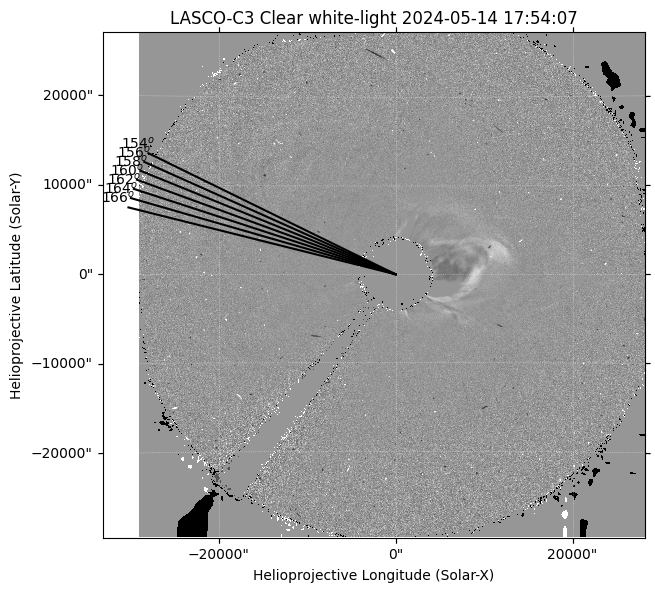

Working on map 1 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


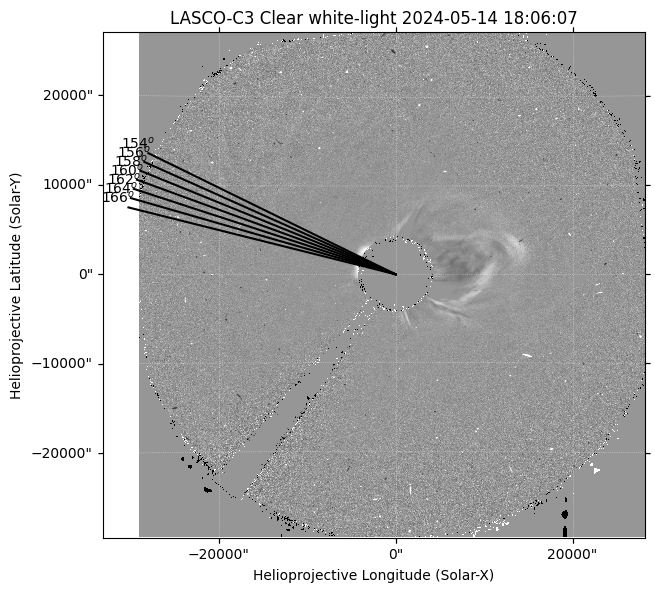

Working on map 2 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


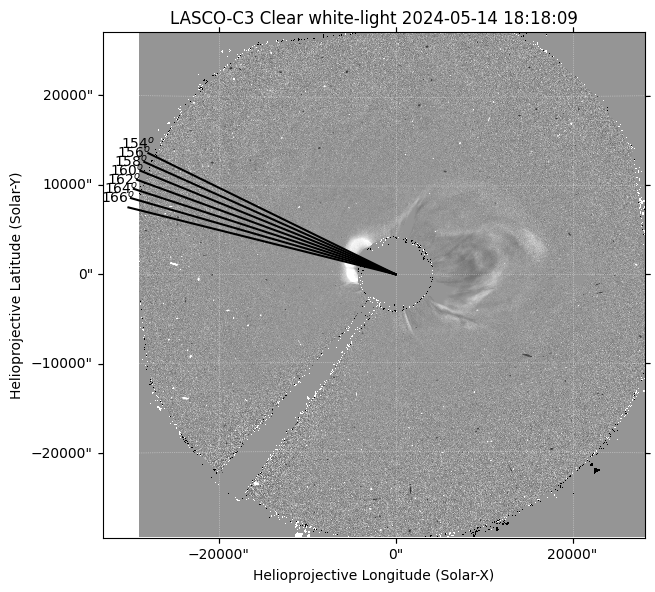

Working on map 3 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


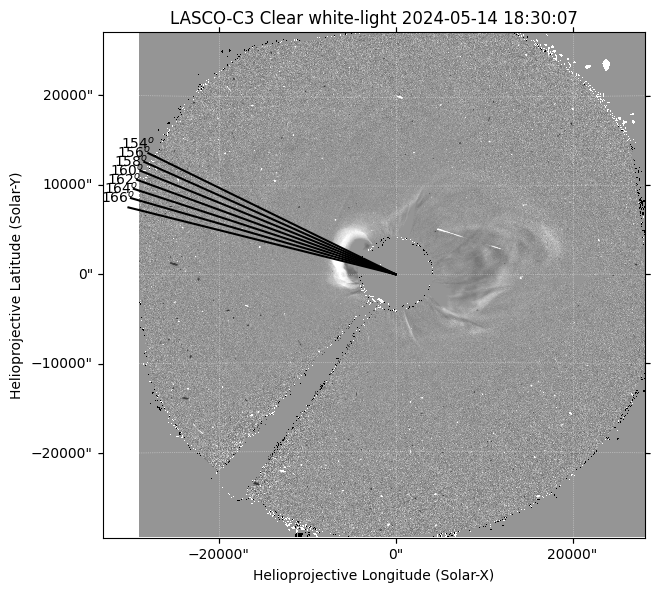

Working on map 4 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


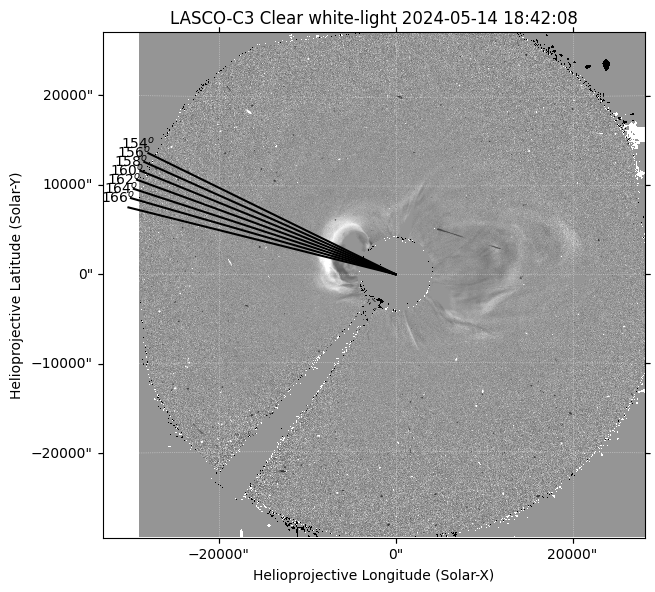

Working on map 5 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


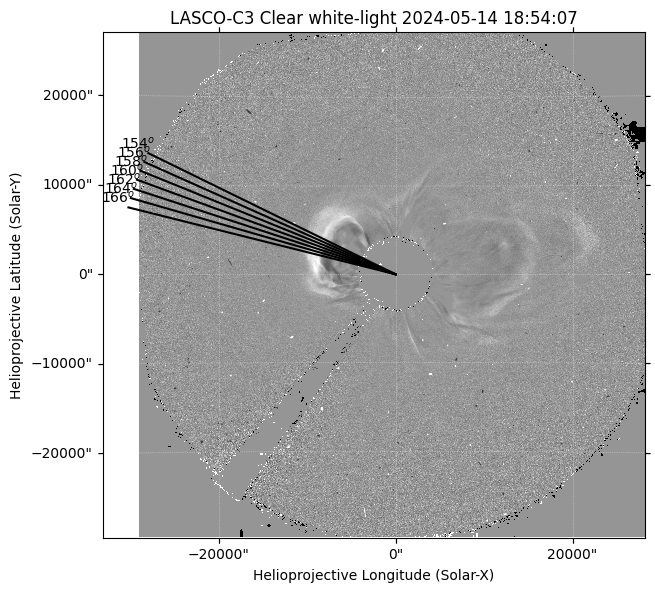

Working on map 6 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


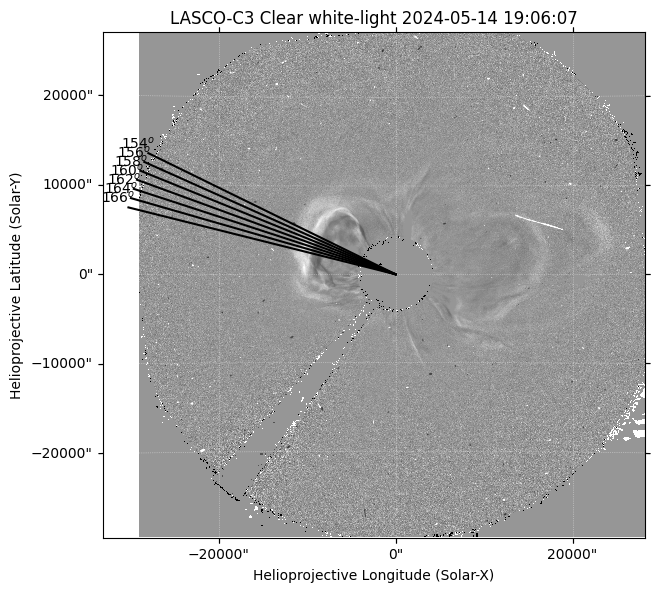

Working on map 7 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


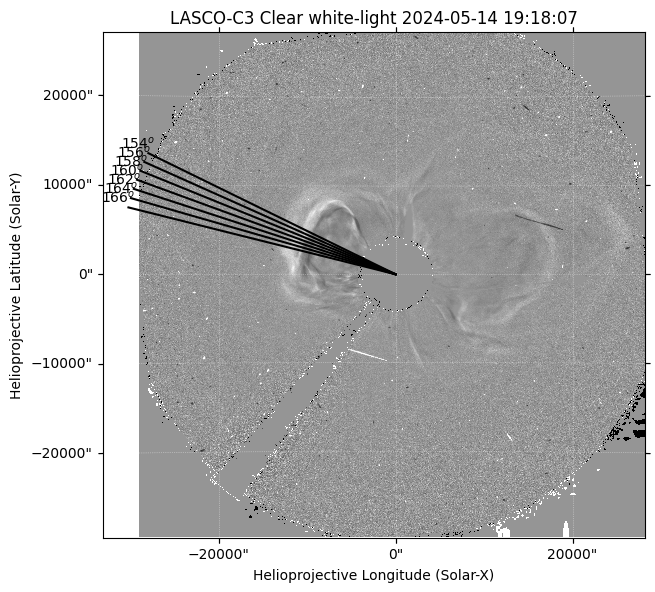

Working on map 8 ..


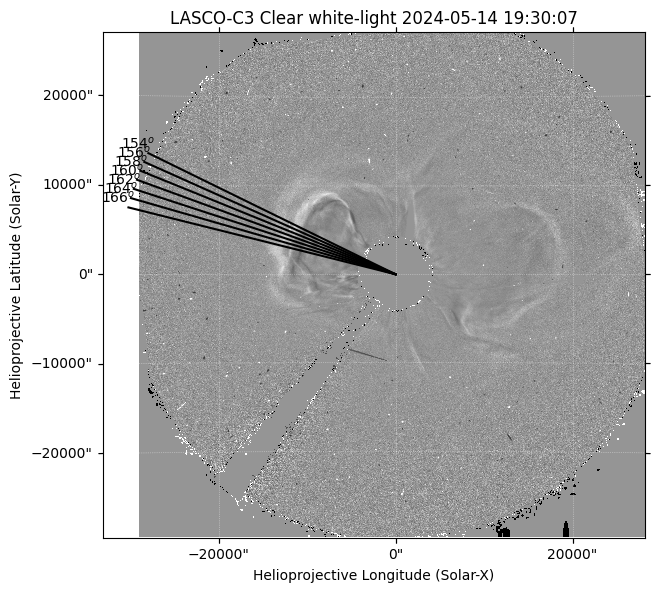

Working on map 9 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


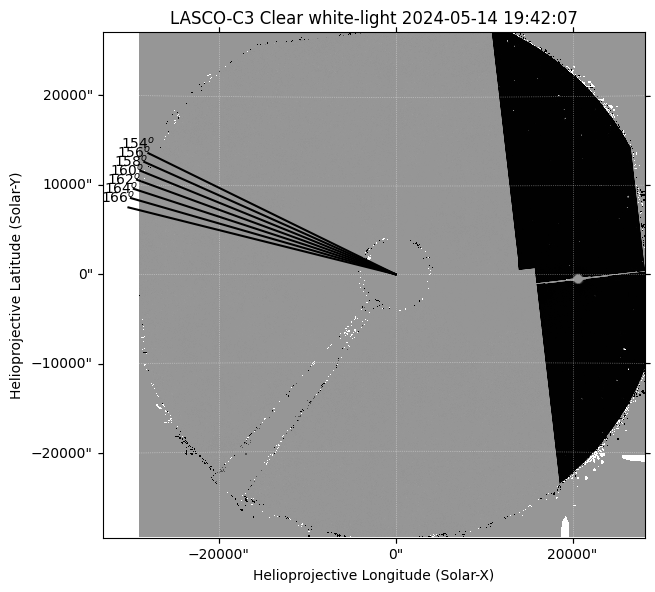

Working on map 10 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


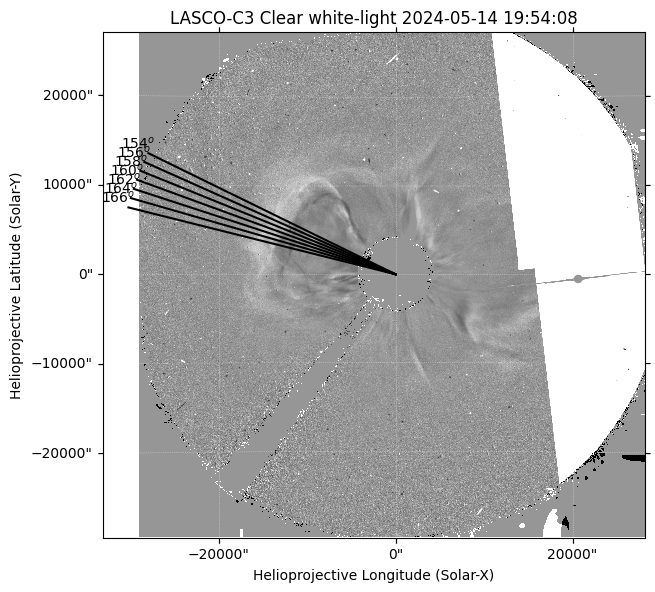

Working on map 11 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


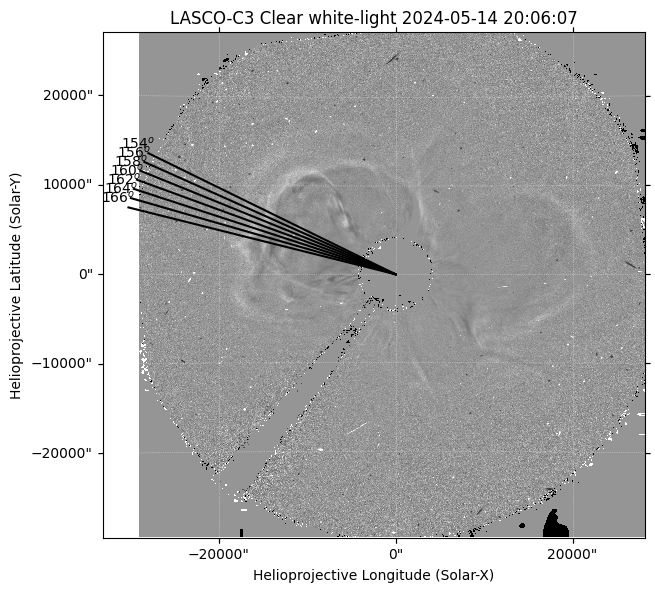

Working on map 12 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


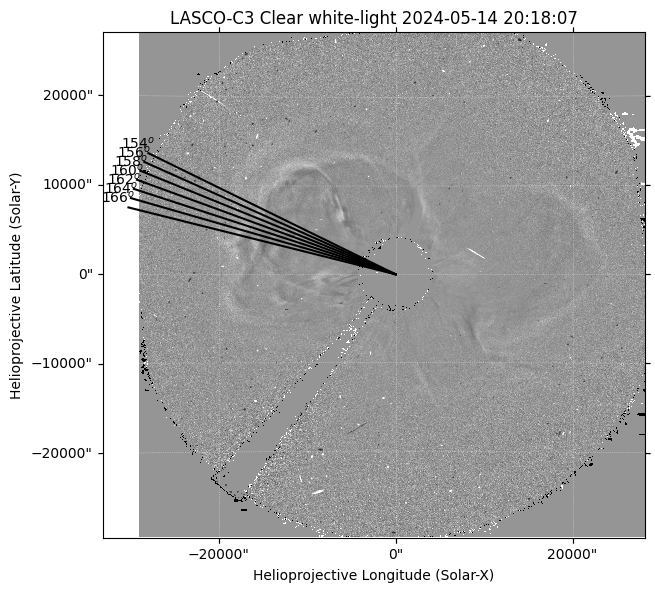

Working on map 13 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


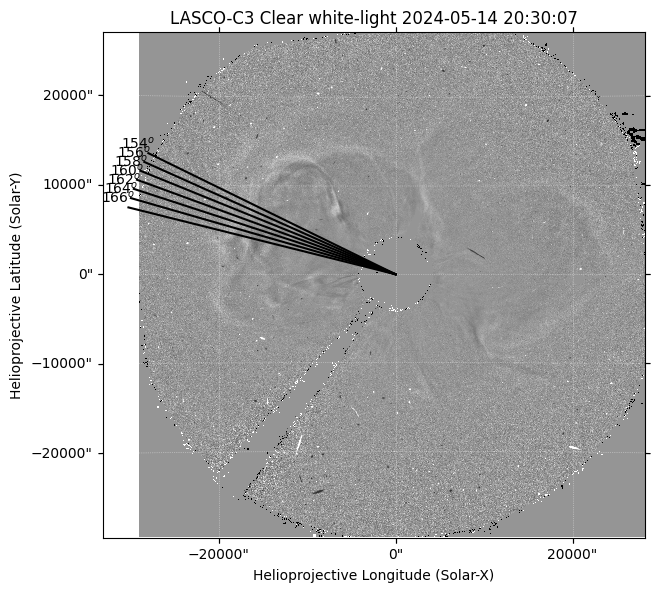

Working on map 14 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


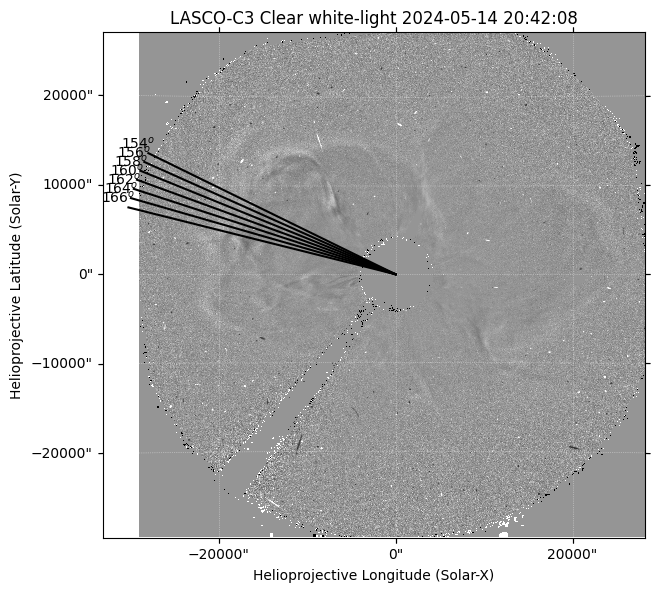

Working on map 15 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


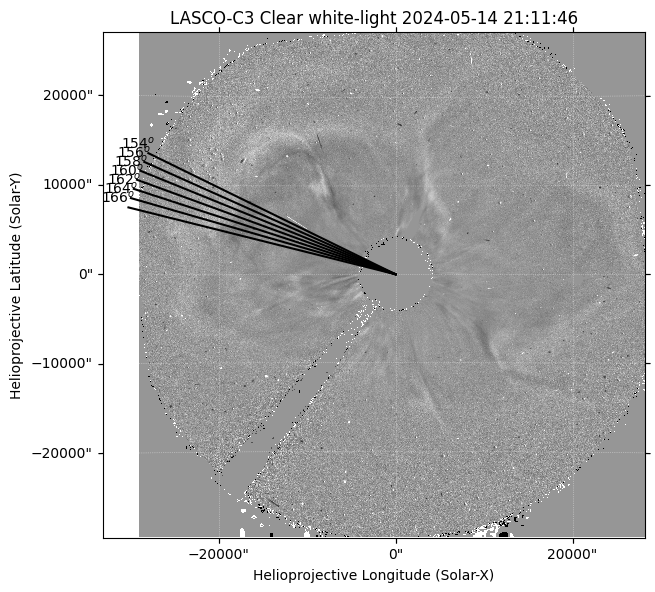

Working on map 16 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


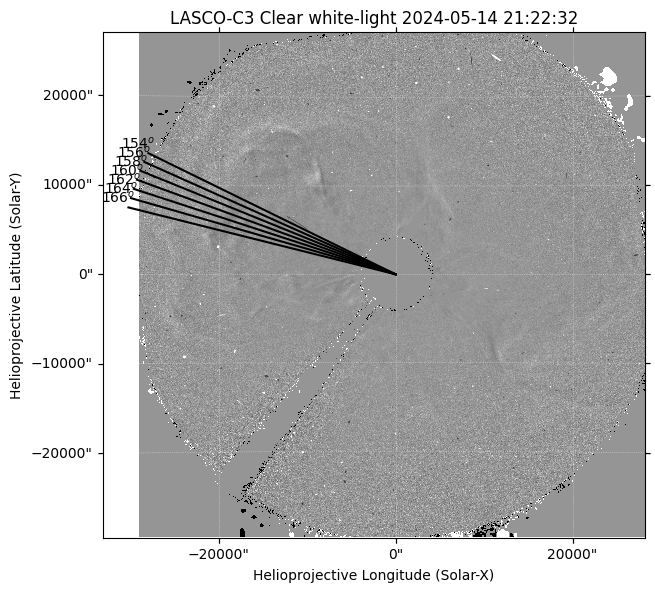

Working on map 17 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


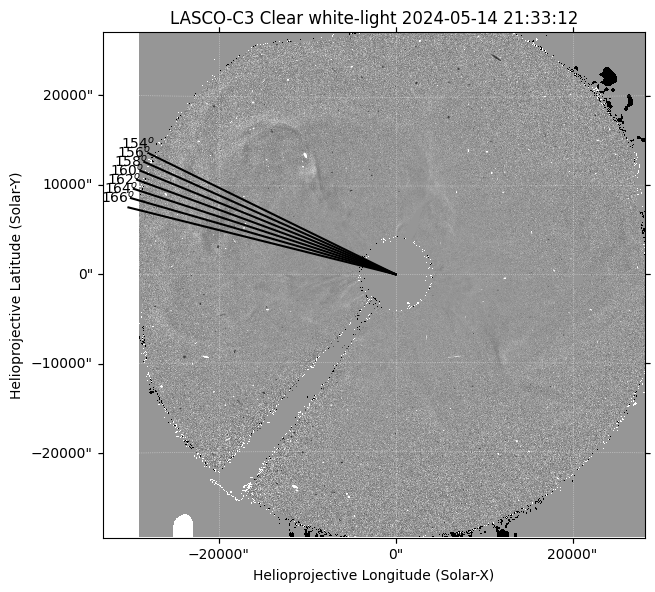

Working on map 18 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


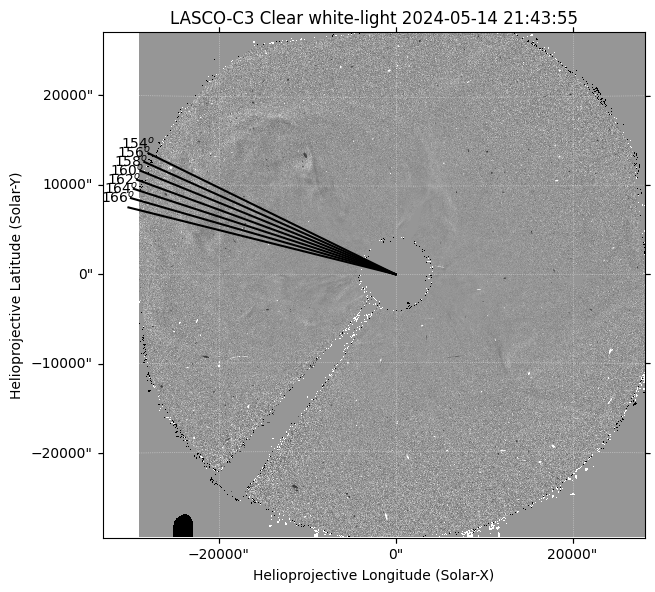

Working on map 19 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


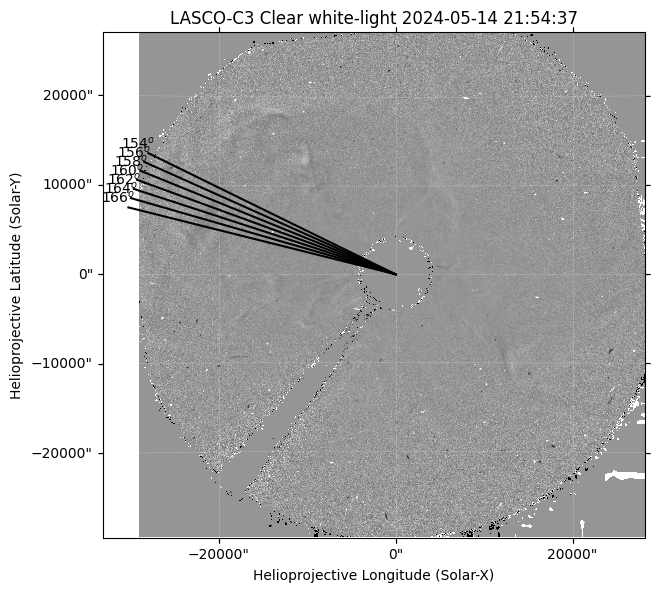

Working on map 20 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


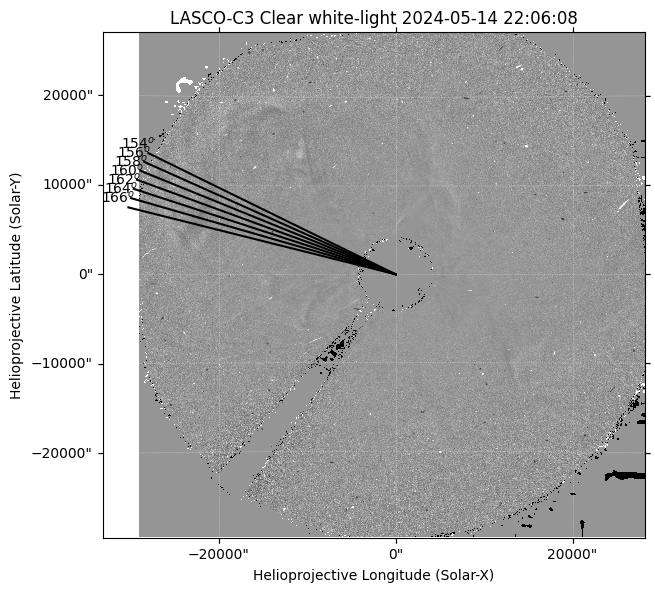

Working on map 21 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


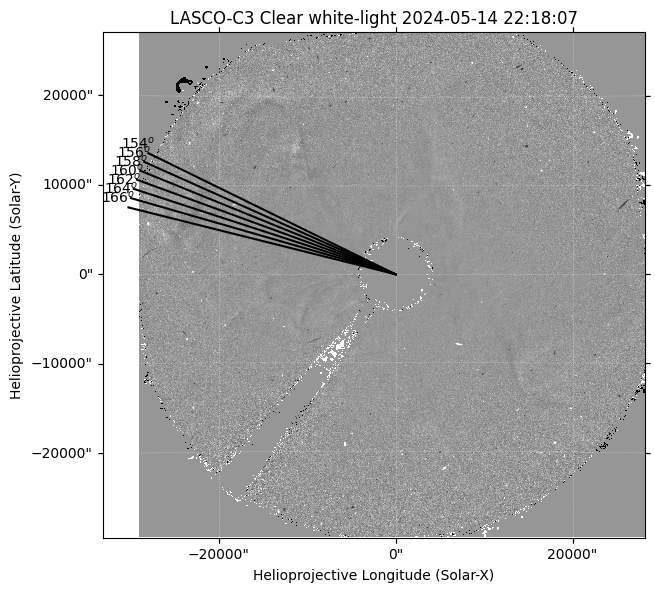

Working on map 22 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


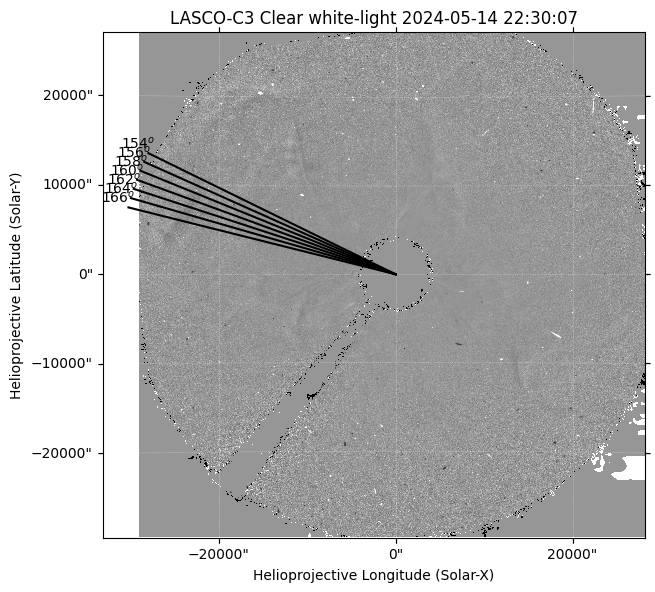

Working on map 23 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


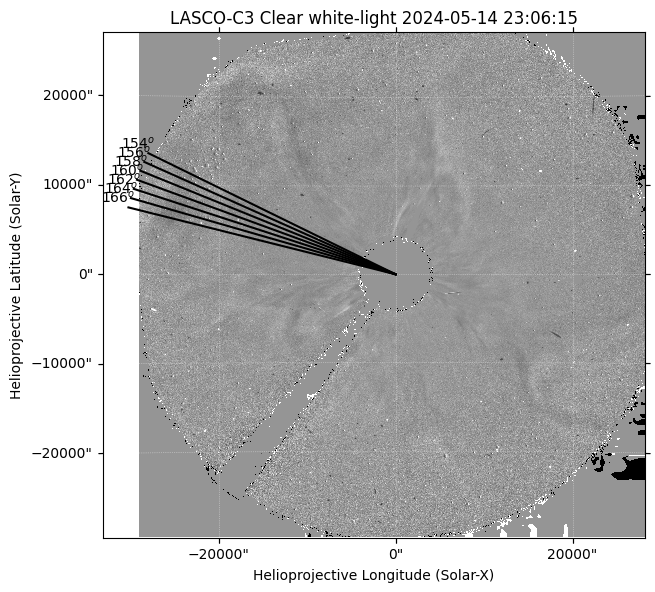

Working on map 24 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


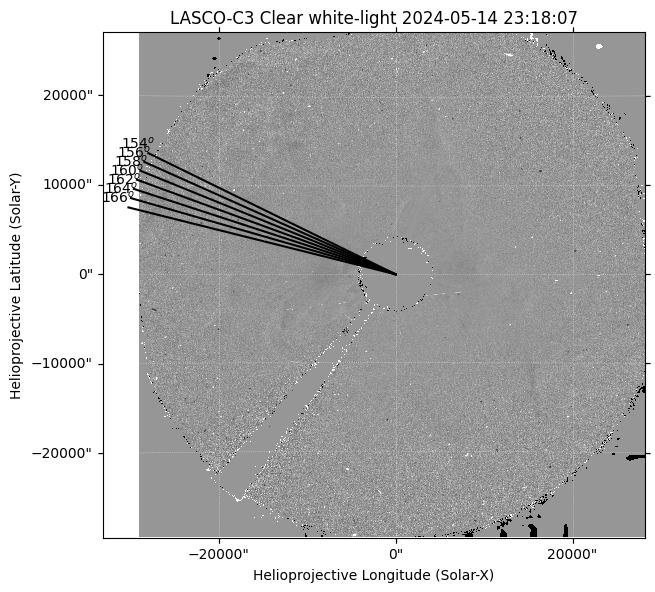

Working on map 25 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


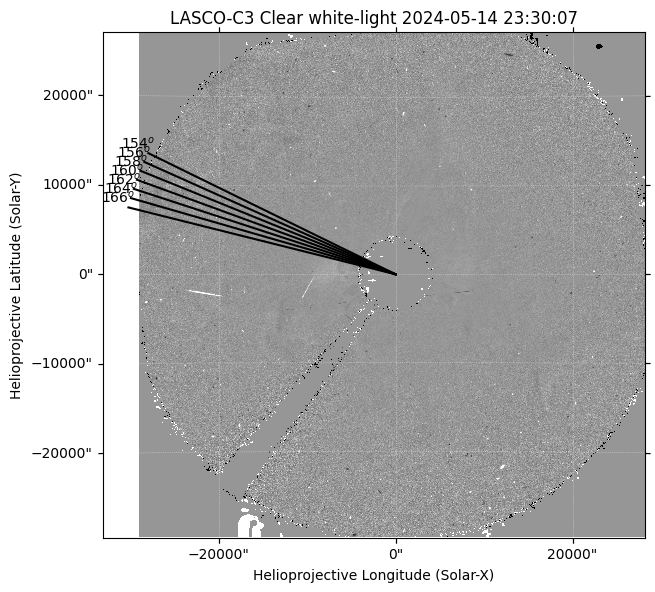

Working on map 26 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


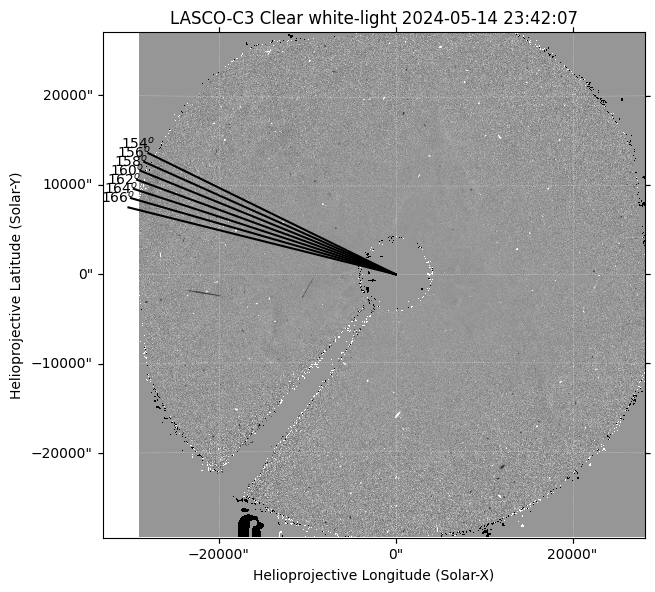

Working on map 27 ..
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


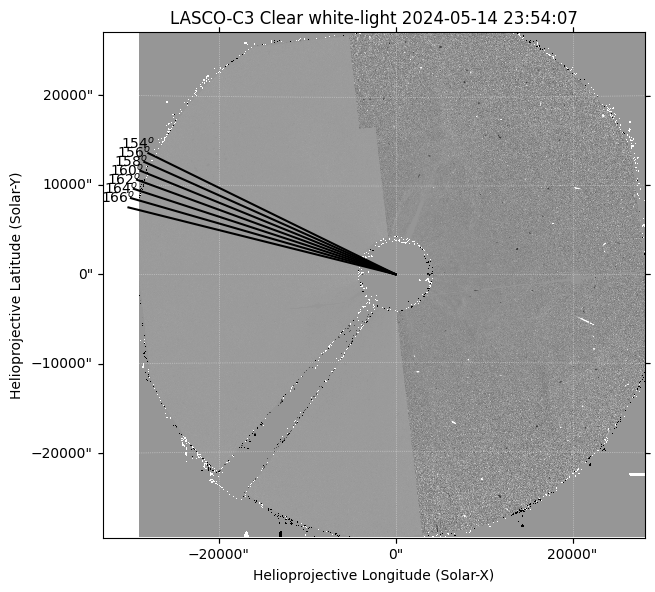

In [9]:
# Make a dictionary to hold the lists of lists
intensity_dict = {}
distances_dict = {}
output_obj = {}
jmaps_coords_list = {}

# Initialize each key with an empty list
for value in centered_list:
    intensity_dict[f'intensity_{value}deg'] = []
    distances_dict[f'distances_{value}deg'] = []
    output_obj[f'intensity_{value}deg'] = []
    output_obj[f'distances_{value}deg'] = []
    jmaps_coords_list[f'{value}'] = []

output_obj['time'] = []
output_obj['map_obj'] = []
output_obj['instrument'] = []

for i, m in enumerate(m_seq_runratio_c3):
    print(f'Working on map {i} ..')
    
    fig = plt.figure(figsize=[7,7])
    ax = fig.add_subplot(111, projection=m)
    m.plot(axes=ax)
    
    for value in centered_list:
        line = plot_line(angle_deg=value, length=31000, map_obj=m)
        ax.plot_coord(line, color='black')
        
        # Plot the number at the end of the line
        # Convert SkyCoord to pixel coordinates for plotting text
        line_lon, line_lat = line.Tx, line.Ty
        end_point_pixel = m.world_to_pixel(SkyCoord(line_lon[1], line_lat[1], frame=m.coordinate_frame))
        
        # Display the number at the end point
        ax.text(end_point_pixel.x.value - 20, end_point_pixel.y.value + 20, f'{value}$^o$',
                color='black', fontsize=10, ha='center', va='center')
        
        # obtain the coordinates of the map pixels that intersect that path
        intensity_coords_slit = sunpy.map.pixelate_coord_path(m, line)
        
        # Create mask to identify valid coordinates
        valid_mask = sunpy.map.contains_coordinate(m, intensity_coords_slit)
        
        # Apply the mask to filter valid coordinates
        valid_coords = intensity_coords_slit[valid_mask]
        
        # Pass those coordinates to extract the values for those map pixels
        intensity_slit = sunpy.map.sample_at_coords(m, valid_coords)
        
        # Calculate the angular separation between the first point and every other coordinate we extracted
        angular_separation_slit = valid_coords.separation(valid_coords[0]).to(u.arcsec)
        
        # Append the values to the lists
        intensity_dict[f'intensity_{value}deg'].append(list(intensity_slit.value))
        distances_dict[f'distances_{value}deg'].append(list(angular_separation_slit.value))
    
    output_obj['time'].append(m.date.iso)
    output_obj['map_obj'].append(m)
    output_obj['instrument'].append(f"{m.meta['instrume']}_{m.meta['detector']}")
    
    plt.show()

In [10]:
list(output_obj.keys())

['intensity_154deg',
 'distances_154deg',
 'intensity_156deg',
 'distances_156deg',
 'intensity_158deg',
 'distances_158deg',
 'intensity_160deg',
 'distances_160deg',
 'intensity_162deg',
 'distances_162deg',
 'intensity_164deg',
 'distances_164deg',
 'intensity_166deg',
 'distances_166deg',
 'time',
 'map_obj',
 'instrument']

In [11]:
datenum_arr = [mdates.date2num(pd.Timestamp(str(t))) for t in output_obj['time']]

for value in centered_list:
    intens = np.array(intensity_dict[f'intensity_{value}deg']).T
    height = np.array(distances_dict[f'distances_{value}deg'][0])
    output_obj[f'intensity_{value}deg'].append(intens)
    output_obj[f'distances_{value}deg'].append(height)

X_start: [0.0, 0.5, 1.0, 1.5, 2.0]
Y_start: [20, 60, 100, 140, 180]
X_end: [25.0, 25.5, 26.0, 26.5, 27.0]
Y_end: [600, 640, 680, 720, 760]


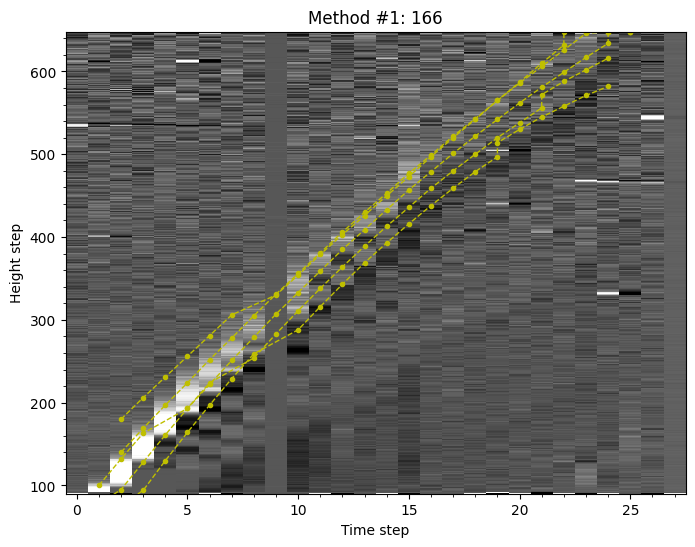

In [12]:
angle = 166

height = output_obj[f'distances_{angle}deg'][0].copy()
intens = output_obj[f'intensity_{angle}deg'][0].copy()
lasco_map = output_obj['map_obj'][0]

psudo_time = np.arange(len(datenum_arr))
psudo_dist = np.arange(len(height))

# # Define start and end points and control point for the Bézier curve
# x1, y1 = 1, 310
# x2, y2 = 5, 740
# control = [4, 850]

# Define start and end points and control point for the Bézier curve
X_start = generate_number_list(1, 0.5, 2)
X_end   = generate_number_list(26, 0.5, 2)
Y_start = generate_number_list(100, 40, 2)
Y_end   = generate_number_list(680, 40, 2)

print(f'X_start: {X_start}')
print(f'Y_start: {Y_start}')
print(f'X_end: {X_end}')
print(f'Y_end: {Y_end}')

control = [16, 500]

x_coords_list = []
y_coords_list = []

fig = plt.figure(figsize=[8,6])
ax = fig.add_subplot(111)
ax.pcolormesh(psudo_time, psudo_dist, intens, vmin=0.7, vmax=1.8, cmap='Greys_r')

# Extract values along the Bézier curve
for (x1, y1, x2, y2) in zip(X_start, Y_start, X_end, Y_end):
    _, x_coords, y_coords = extract_bezier_values(intens, x1, y1, x2, y2, control)
    x_coords_list.append(x_coords[:-1])
    y_coords_list.append(y_coords[:-1])
    ax.plot(x_coords[:-1], y_coords[:-1], 'yo--', linewidth=1, markersize=3, alpha=1)

# Compute mean and standard error for x and y coordinates
mean_x_coords, standard_error_x = compute_standard_error(x_coords_list)
mean_y_coords, standard_error_y = compute_standard_error(y_coords_list)

# Plot the mean Bezier curve with error bars
# ax.plot(mean_x_coords, mean_y_coords, 'ro--', linewidth=1, markersize=2)
# ax.errorbar(mean_x_coords, mean_y_coords,
#             xerr=standard_error_x, yerr=standard_error_y,
#             fmt='ro', ecolor='blue', barsabove=False, markersize=2, elinewidth=1, capsize=3)

ax.set_xlabel('Time step')
ax.set_ylabel('Height step')
ax.set_title(f'Method #1: {angle}')
ax.xaxis.set_minor_locator(AutoMinorLocator(n=5))
ax.yaxis.set_minor_locator(AutoMinorLocator(n=5))
ax.set_ylim(bottom=90, top=psudo_dist[-1])
# ax.set_xlim(right=8)
plt.show()

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


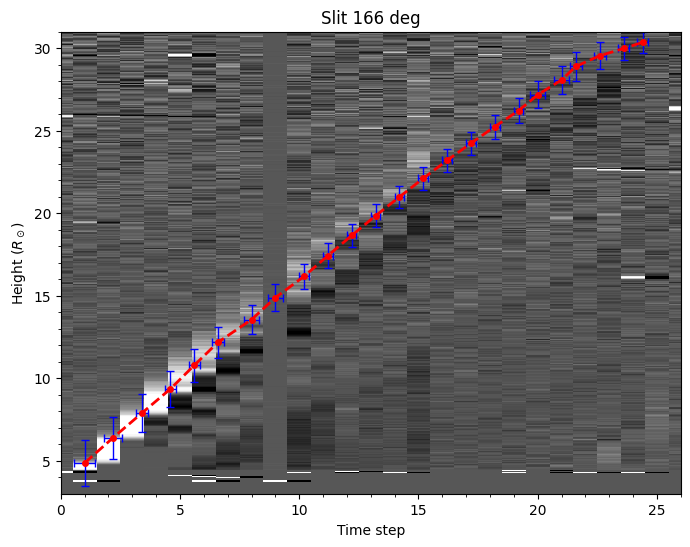

In [13]:
# conversion from arcsec to solar radius
dist_rsun = height/lasco_map.rsun_obs.value

fig = plt.figure(figsize=[8,6])
ax = fig.add_subplot(111)
ax.pcolormesh(psudo_time, dist_rsun, intens, vmin=0.7, vmax=1.8, cmap='Greys_r')

mean_y_coords, standard_error_y = compute_standard_error(dist_rsun[y_coords_list])

ax.errorbar(mean_x_coords, mean_y_coords,
            xerr=standard_error_x, yerr=standard_error_y,
            fmt='ro--', ecolor='blue', barsabove=False, linewidth=2,
            markersize=4, elinewidth=1, capsize=3)

ax.set_xlabel('Time step')
ax.set_ylabel(r'Height ($R_\odot$)')
ax.set_title(f'Slit {angle} deg')
ax.xaxis.set_minor_locator(AutoMinorLocator(n=5))
ax.yaxis.set_minor_locator(AutoMinorLocator(n=5))
ax.set_ylim(bottom=3, top=31)
ax.set_xlim(left=0, right=26)
plt.show()

In [14]:
jmaps_coords_list

{'154': [], '156': [], '158': [], '160': [], '162': [], '164': [], '166': []}

In [15]:
# # Export the list as a pickle file
# import pickle

# with open('./jmap_extracted_values_LASCO_C2.pkl', 'wb') as f:
#     pickle.dump(extracted_values, f)

## Looping over all slits doesn't give a good result since every slit has a bit different variation of the feature. So I have to tweak the curve parameters one by one

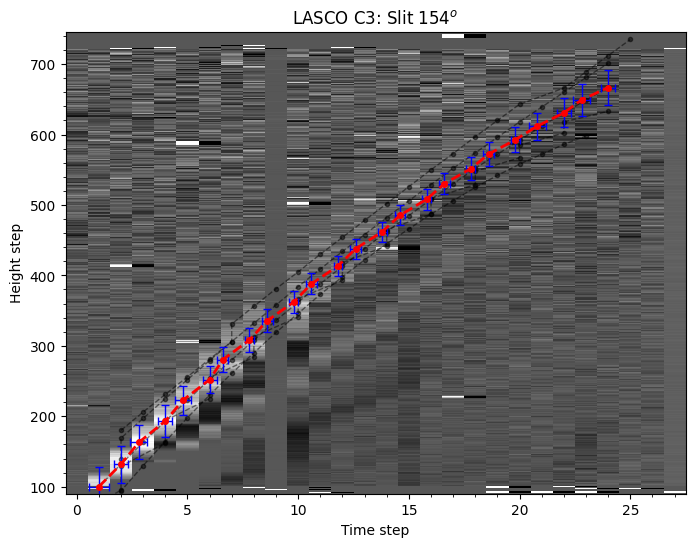

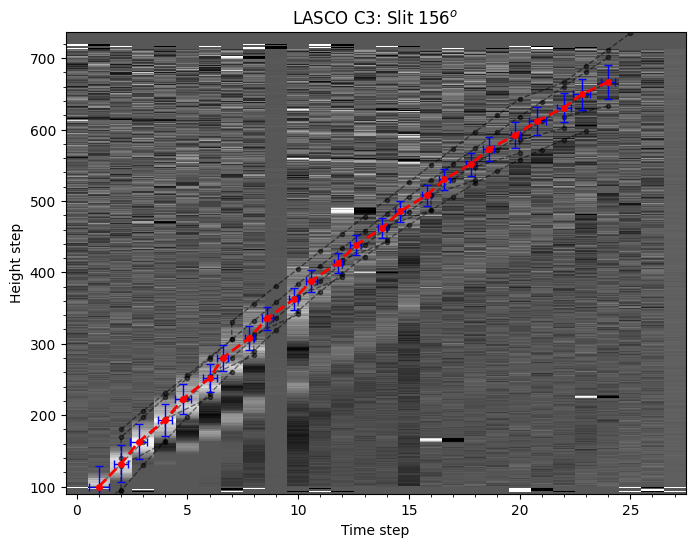

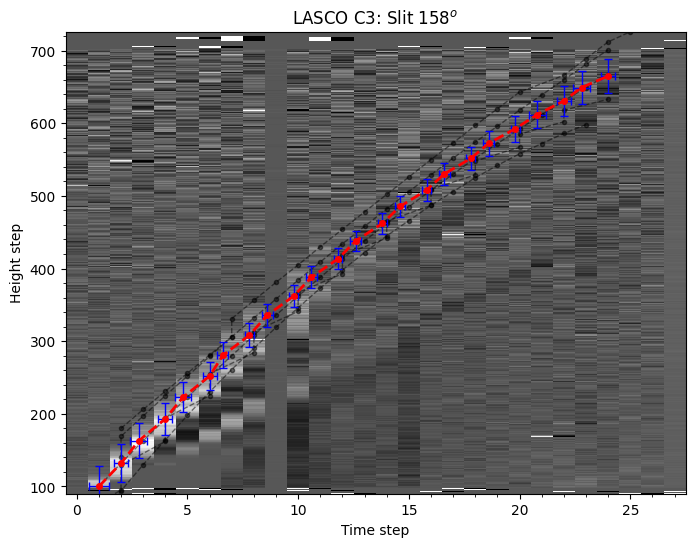

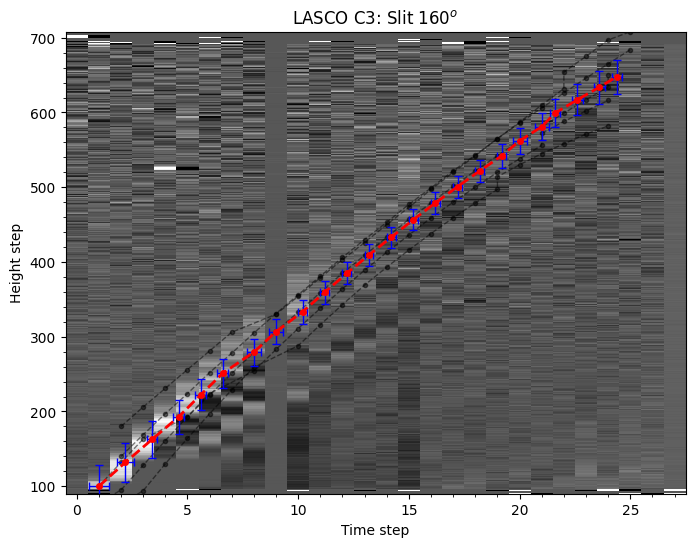

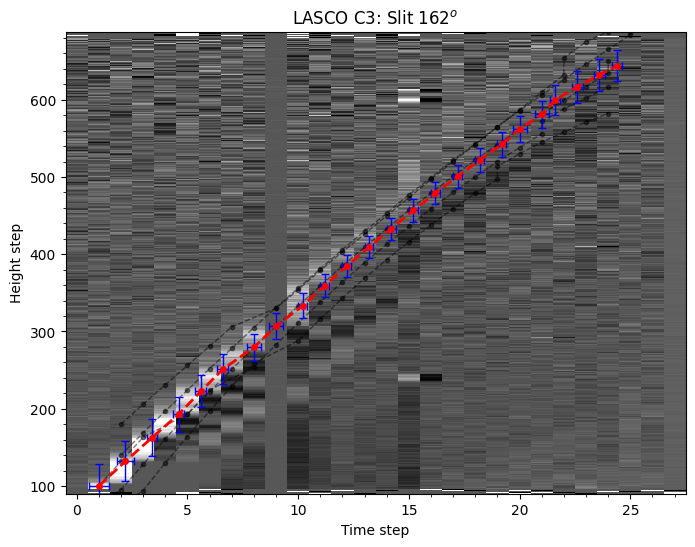

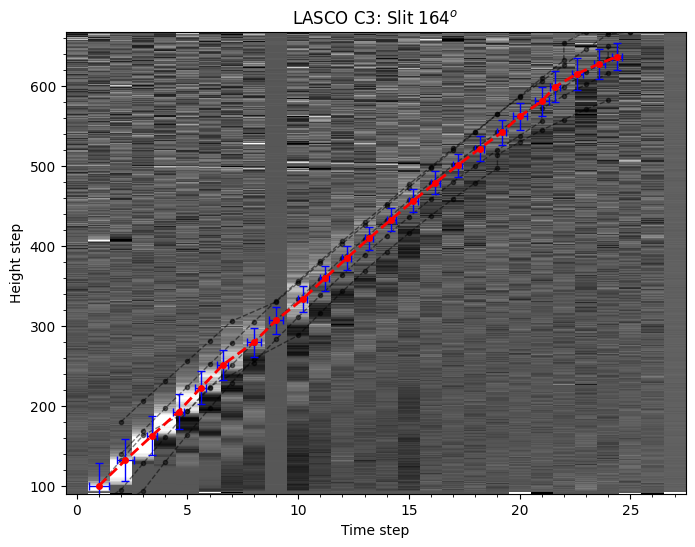

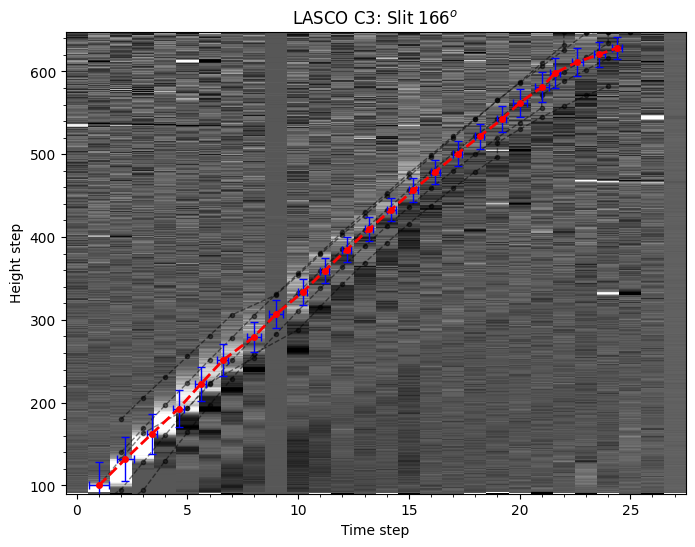

In [16]:
# Define start and end points and control point for the Bézier curve
xx_start = 1
xx_end   = 26

yy_start = [100, 100, 100, 100, 100, 100, 100]
yy_end   = [700, 700, 700, 680, 680, 680, 680]
controls = [ [13,500], [13,500], [13,500], [16,500], [16,500], [16,500], [16,500] ]

for i, angle in enumerate(centered_list):
    
    X_start = generate_number_list(xx_start, 0.5, 2)
    X_end   = generate_number_list(xx_end, 0.5, 2)
    Y_start = generate_number_list(yy_start[i], 40, 2)
    Y_end   = generate_number_list(yy_end[i], 40, 2)
    control = controls[i]

    height = output_obj[f'distances_{angle}deg'][0].copy()
    intens = output_obj[f'intensity_{angle}deg'][0].copy()
    
    # Define a psudo time and distance axes for the Bezier curve method to work
    psudo_time = np.arange(len(datenum_arr))
    psudo_dist = np.arange(len(height))
    
    x_coords_list = []
    y_coords_list = []
    
    fig = plt.figure(figsize=[8,6])
    ax = fig.add_subplot(111)
    ax.pcolormesh(psudo_time, psudo_dist, intens, vmin=0.7, vmax=1.8, cmap='Greys_r')
    
    # Extract values along the Bézier curves
    for (x1, y1, x2, y2) in zip(X_start, Y_start, X_end, Y_end):
        _, x_coords, y_coords = extract_bezier_values(intens, x1, y1, x2, y2, control)
        x_coords_list.append(x_coords[:-1])
        y_coords_list.append(y_coords[:-1])
        ax.plot(x_coords[:-1], y_coords[:-1], 'ko--', linewidth=1, markersize=3, alpha=0.5)
    
    # Compute mean and standard error for x and y coordinates
    mean_x_coords, standard_error_x = compute_standard_error(x_coords_list)
    mean_y_coords, standard_error_y = compute_standard_error(y_coords_list)
    
    # Store the final ccurves values
    df = pd.DataFrame({
        'x_coords': mean_x_coords,
        'y_coords': mean_y_coords,
        'x_err': standard_error_x,
        'y_err': standard_error_y,
        'x1': xx_start,
        'x2': xx_end,
        'y1': yy_start[i],
        'y2': yy_end[i],
        'control_point_x': control[0],
        'control_point_y': control[1]
    })
    jmaps_coords_list[f'{angle}'].append(df)
    
    # Plot the mean Bezier curve with error bars
    ax.errorbar(mean_x_coords, mean_y_coords,
                xerr=standard_error_x, yerr=standard_error_y,
                fmt='ro--', ecolor='blue', barsabove=False, linewidth=2,
                markersize=4, elinewidth=1, capsize=3)
    
    ax.set_xlabel('Time step')
    ax.set_ylabel('Height step')
    ax.set_title(f'LASCO C3: Slit {angle}$^o$')
    ax.xaxis.set_minor_locator(AutoMinorLocator(n=5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(n=5))
    ax.set_ylim(bottom=90, top=psudo_dist[-1])
    plt.show()

In [17]:
# print(f'Number of slits: {len(jmaps_coords_list)}')
# print(f'Their data:\n{jmaps_coords_list}')

## Fitting the points

### Start with one angle as an example

In [18]:
centered_list

[154, 156, 158, 160, 162, 164, 166]

In [19]:
angle = 154
df = jmaps_coords_list[f'{angle}'][0].copy()
display(df)

,x_coords,y_coords,x_err,y_err,x1,x2,y1,y2,control_point_x,control_point_y
0,1.0,100.0,0.447214,28.284271,1,26,100,700,13,500
1,2.0,132.0,0.316228,26.162951,1,26,100,700,13,500
2,2.8,162.8,0.374166,24.183465,1,26,100,700,13,500
3,4.0,193.2,0.316228,22.274200,1,26,100,700,13,500
4,4.8,222.8,0.374166,20.648002,1,26,100,700,13,500
5,6.0,252.0,0.316228,19.091883,1,26,100,700,13,500
6,6.6,280.4,0.244949,17.890221,1,26,100,700,13,500
7,7.8,308.2,0.200000,16.829736,1,26,100,700,13,500
8,8.6,335.6,0.244949,16.051791,1,26,100,700,13,500
9,9.8,362.2,0.200000,15.203289,1,26,100,700,13,500


In [20]:
# Extract time and distance arrays from the selected coordinates
height    = output_obj[f'distances_{angle}deg'][0].copy()
intens    = output_obj[f'intensity_{angle}deg'][0].copy()
lasco_map = output_obj['map_obj'][0]

x_coords = df['x_coords'].astype('int')
times_num = np.array(datenum_arr)[x_coords]
df['time'] = times_num

y_coords = df['y_coords']
y_coords = round(y_coords).astype('int')
distances = height[y_coords] # in arcsec
df['distance'] = distances

# Perform linear regression to fit a line
slope, intercept, r_value, p_value, std_err = stats.linregress(times_num, distances)

# get the radius of the solar disk
sol_rad = const.equatorial_radius.to(u.km)
print(sol_rad)

# conversion factor from arcsec to km
conversion_factor = sol_rad/lasco_map.rsun_obs
print(conversion_factor)

695700.0 km
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
733.1029920180301 km / arcsec


In [21]:
# convert distance from arcsec to km
df['distance_km'] = df['distance'] * conversion_factor.value

# calculate the distance difference in km
df['distance_diff_km'] = df['distance_km'].diff()

# convert time to datetime format
df['datetime'] = [mdates.num2date(t) for t in df['time']]

# calculate the time difference in seconds
df['time_diff_s'] = df['datetime'].diff().dt.total_seconds()

# calculate the speed in km/s
df['speed_km_s'] = df['distance_diff_km'] / df['time_diff_s']

# drop the first row which will have NaN values for the differences
df.dropna(inplace=True)

# Filter out rows where time_diff_s is 0 and speed_km_s is inf
df = df[~((df['time_diff_s'] == 0) & (df['speed_km_s'] == np.inf))]

In [22]:
display(df)

,x_coords,y_coords,x_err,y_err,x1,x2,y1,y2,control_point_x,control_point_y,time,distance,distance_km,distance_diff_km,datetime,time_diff_s,speed_km_s
1,2.0,132.0,0.316228,26.162951,1,26,100,700,13,500,19857.762612,5508.363378,4.038198e+06,972475.052188,2024-05-14 18:18:09.644000+00:00,722.191,1346.562131
3,4.0,193.2,0.316228,22.274200,1,26,100,700,13,500,19857.779267,8060.093033,5.908878e+06,916790.699447,2024-05-14 18:42:08.627000+00:00,1438.983,637.110167
5,6.0,252.0,0.316228,19.091883,1,26,100,700,13,500,19857.795920,10534.611958,7.722956e+06,897719.402961,2024-05-14 19:06:07.510000+00:00,1438.883,623.900208
7,7.8,308.2,0.200000,16.829736,1,26,100,700,13,500,19857.804255,12856.029330,9.424794e+06,841317.688021,2024-05-14 19:18:07.601000+00:00,720.091,1168.349123
8,8.6,335.6,0.244949,16.051791,1,26,100,700,13,500,19857.812586,14028.204915,1.028412e+07,859325.428667,2024-05-14 19:30:07.397000+00:00,719.796,1193.845796
9,9.8,362.2,0.200000,15.203289,1,26,100,700,13,500,19857.820921,15124.958773,1.108815e+07,804033.534871,2024-05-14 19:42:07.584000+00:00,720.187,1116.423283
10,10.6,388.0,0.244949,14.849242,1,26,100,700,13,500,19857.829267,16195.446204,1.187293e+07,784777.538402,2024-05-14 19:54:08.675000+00:00,721.091,1088.319697
11,11.8,413.4,0.200000,14.354790,1,26,100,700,13,500,19857.837586,17240.540773,1.263909e+07,766161.955595,2024-05-14 20:06:07.466000+00:00,718.791,1065.903657
12,12.6,438.0,0.244949,14.142136,1,26,100,700,13,500,19857.845922,18284.766417,1.340462e+07,765524.944008,2024-05-14 20:18:07.658000+00:00,720.192,1062.945637
13,13.8,462.0,0.200000,14.142136,1,26,100,700,13,500,19857.854253,19278.210641,1.413291e+07,728296.933032,2024-05-14 20:30:07.449000+00:00,719.791,1011.817226


In [23]:
# Calculate spline fit
spline = UnivariateSpline(times_num, distances, k=1, s=None)  # s=0 for interpolation through all points

# Generate the spline line
spline_times = np.linspace(min(times_num), max(times_num), 1000)
spline_distances = spline(spline_times)

# Calculate the derivative of spline_distances with respect to spline_times
spline_velocity = spline.derivative()(spline_times)

# Convert velocity (in arcsec/day) to speed in km/s
# 1 arcsec ≈ 733 km on the Sun's surface
# 1 day = 86400 seconds
speed_spline = spline_velocity * conversion_factor.value / 86400  # km/s

# Calculate the polynomial fit
polyfit_coeff = np.polyfit(times_num, distances, 2)  # Fit a 2nd order polynomial
polyfit_line = np.polyval(polyfit_coeff, spline_times)

# Calculate the derivative of the polynomial fit (velocity)
polyfit_velocity = np.polyval(np.polyder(polyfit_coeff), spline_times)
speed_polyfit = polyfit_velocity * conversion_factor.value / 86400  # km/s

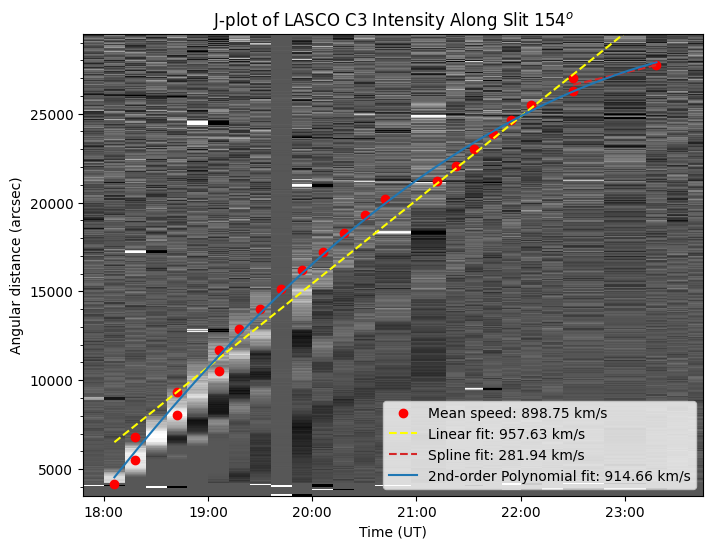

In [24]:
fig = plt.figure(figsize=[8,6])
ax = fig.add_subplot(111)
ax.pcolormesh(datenum_arr, height, intens, vmin=0.7, vmax=1.8, cmap='Greys_r')

# Plot the fitted line
fit_line = slope*times_num + intercept

# Calculate the speed (slope in arcsec/day to speed in km/s)
# 1 arcsec ≈ 733 km on the Sun's surface
# 1 day = 86400 seconds
speed_fit = slope * conversion_factor.value/86400  # km/s
speed = df['speed_km_s'].mean()

# Plot the selected points
ax.plot(times_num, distances, 'ro', label=f'Mean speed: {speed:.2f} km/s')
ax.plot(times_num, fit_line, ls='--', color='yellow',
        label=f'Linear fit: {speed_fit:.2f} km/s')

# Plot the spline fit line
ax.plot(spline_times, spline_distances, ls='--', color='tab:red',
        label=f'Spline fit: {np.nanmean(speed_spline):.2f} km/s')

# Plot the polynomial fit line
ax.plot(spline_times, polyfit_line, ls='-', color='tab:blue',
           label=f'2nd-order Polynomial fit: {np.nanmean(speed_polyfit):.2f} km/s')

ax.set_xlabel('Time (UT)')
ax.set_ylabel('Angular distance (arcsec)')
ax.set_title(f"J-plot of {output_obj['instrument'][0].replace('_',' ')} Intensity Along Slit {angle}$^o$")
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.yaxis.set_minor_locator(AutoMinorLocator(n=5))
ax.legend(loc='lower right')
ax.set_xlim(right=pd.Timestamp(f"{output_obj['time'][0].split(' ')[0]} 23:45:00"))
ax.set_ylim(bottom=3500, top=29500)
plt.show()

### Export the tables and J-Maps with fitting for all slits

[19857.75425293 19857.76261162 19857.76261162 19857.77926652
 19857.77926652 19857.79592025 19857.79592025 19857.80425464
 19857.81258561 19857.82092111 19857.82926707 19857.83758641
 19857.84592197 19857.85425288 19857.86259538 19857.88317503
 19857.89065176 19857.89805907 19857.90550691 19857.91293274
 19857.92092918 19857.93758638 19857.93758638 19857.97091932]
[ 4181.8443726   5508.3633785   6809.53109355  8060.0930329
  9310.0645035  10534.61195827 11708.41747032 12856.02933002
 14028.2049152  15124.95877329 16195.44620404 17240.5407732
 18284.76641727 19278.21064129 20220.98817496 21188.22693928
 22079.56442619 22995.30616752 23836.21938834 24651.09195888
 25465.23020156 26254.24599313 26993.1024688  27731.26382739]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


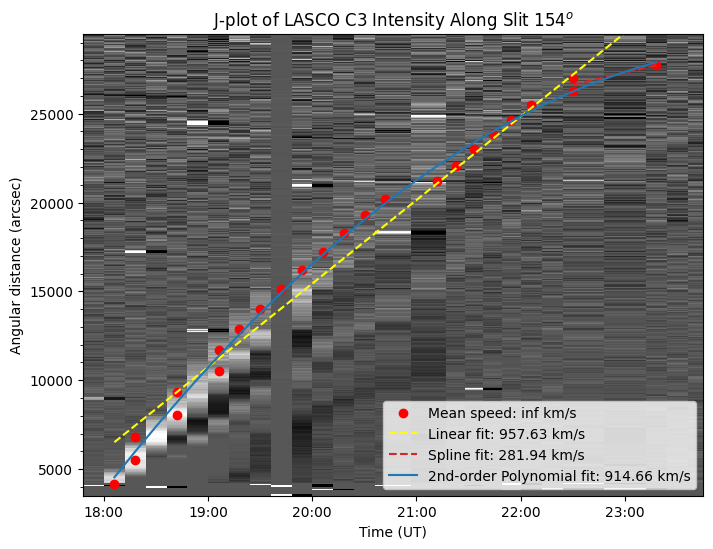

[19857.75425293 19857.76261162 19857.76261162 19857.77926652
 19857.77926652 19857.79592025 19857.79592025 19857.80425464
 19857.81258561 19857.82092111 19857.82926707 19857.83758641
 19857.84592197 19857.85425288 19857.86259538 19857.88317503
 19857.89065176 19857.89805907 19857.90550691 19857.91293274
 19857.92092918 19857.93758638 19857.93758638 19857.97091932]
[ 4235.46363664  5587.98327951  6889.08006628  8166.55234292
  9443.47136184 10668.72598031 11842.32193578 13015.19282147
 14215.12055913 15312.54399678 16409.10038146 17453.99565548
 18498.01361154 19518.32961553 20487.12066131 21455.00911581
 22371.43806312 23286.99016826 24128.62047298 24969.45239944
 25781.71983629 26598.32876136 27336.21241277 28073.42840241]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


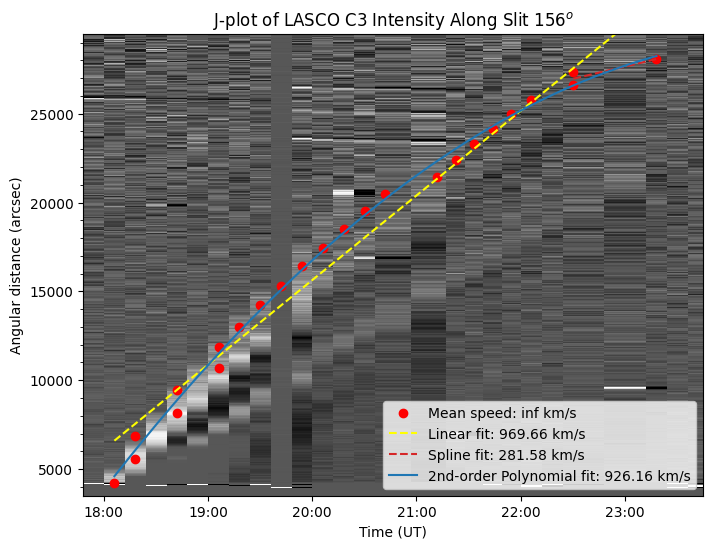

[19857.75425293 19857.76261162 19857.76261162 19857.77926652
 19857.77926652 19857.79592025 19857.79592025 19857.80425464
 19857.81258561 19857.82092111 19857.82926707 19857.83758641
 19857.84592197 19857.85425288 19857.86259538 19857.88317503
 19857.89065176 19857.89805907 19857.90550691 19857.91293274
 19857.92092918 19857.93758638 19857.93758638 19857.97091932]
[ 4294.25459832  5645.98919726  7006.25855443  8283.7330355
  9560.62943003 10815.61721844 12018.1743908  13219.91864144
 14420.76818169 15517.49444548 16643.88823679 17687.30986946
 18760.26577777 19780.84697508 20779.54964108 21746.85516393
 22692.3665376  23606.55563203 24447.8770711  25318.6341252
 26158.23949388 26946.01551431 27712.2330217  28406.10134768]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


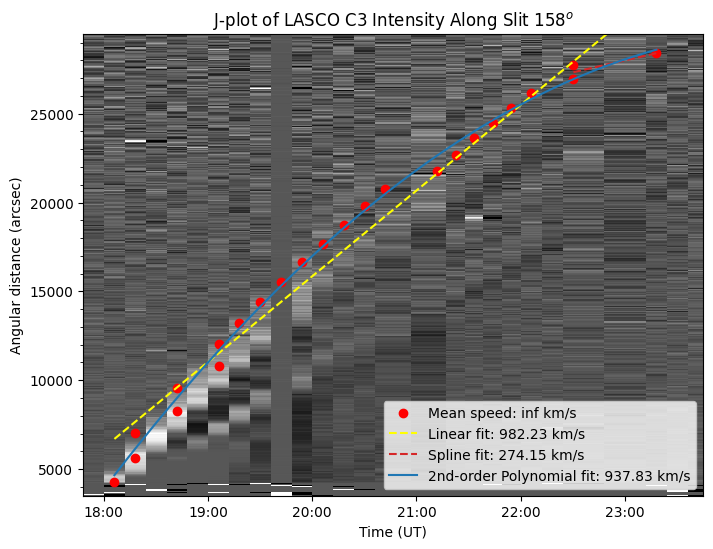

[19857.75425293 19857.76261162 19857.77092286 19857.77926652
 19857.78758701 19857.79592025 19857.81258561 19857.82092111
 19857.82926707 19857.83758641 19857.84592197 19857.85425288
 19857.86259538 19857.88317503 19857.89065176 19857.89805907
 19857.90550691 19857.91293274 19857.92092918 19857.92925315
 19857.92925315 19857.93758638 19857.96268098 19857.97091932]
[ 4358.00768413  5740.0877073   7102.13233674  8411.18485391
  9667.14674382 10922.40591442 12157.49577392 13358.72522824
 14487.47482348 15615.35618124 16775.31808882 17796.86265174
 18850.55007555 19870.28451158 20817.91577033 21764.66740519
 22691.40221982 23565.38405038 24405.65215042 25226.12515374
 25994.06254226 26761.28125041 27508.78655132 28100.78154679]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


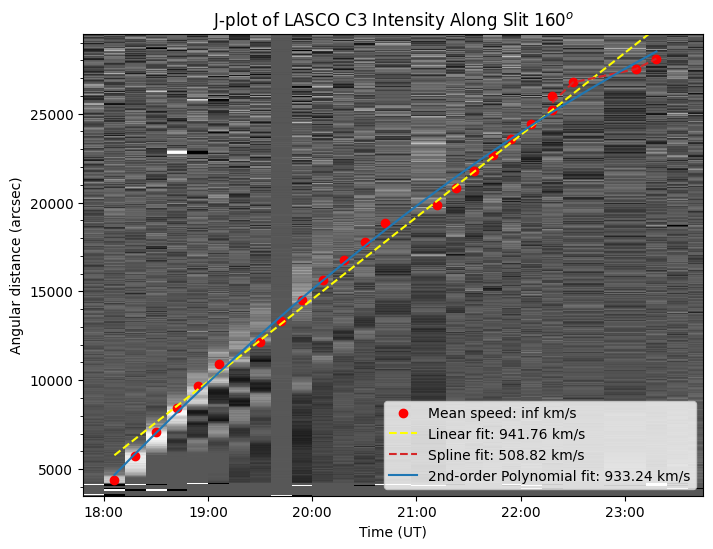

[19857.75425293 19857.76261162 19857.77092286 19857.77926652
 19857.78758701 19857.79592025 19857.81258561 19857.82092111
 19857.82926707 19857.83758641 19857.84592197 19857.85425288
 19857.86259538 19857.88317503 19857.89065176 19857.89805907
 19857.90550691 19857.91293274 19857.92092918 19857.92925315
 19857.92925315 19857.93758638 19857.96268098 19857.97091932]
[ 4426.5082      5842.32475428  7204.5515419   8548.4460448
  9838.65856656 11128.11846755 12363.6981654  13598.39232196
 14761.81079194 15888.74660508 17050.22342771 18105.03377043
 19158.89696306 20211.75910492 21193.65457612 22139.22897127
 23066.63030866 23940.60891114 24813.72541387 25668.78253245
 26435.40157068 27236.46105149 27879.95255567 28401.37985546]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


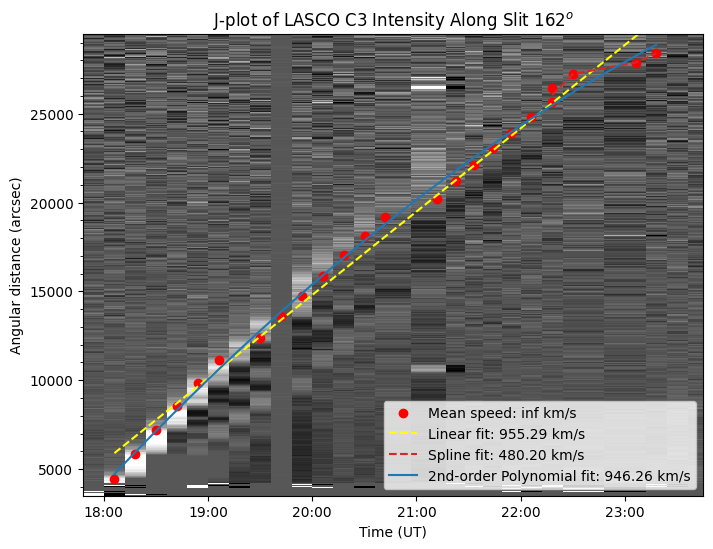

[19857.75425293 19857.76261162 19857.77092286 19857.77926652
 19857.78758701 19857.79592025 19857.81258561 19857.82092111
 19857.82926707 19857.83758641 19857.84592197 19857.85425288
 19857.86259538 19857.88317503 19857.89065176 19857.89805907
 19857.90550691 19857.91293274 19857.92092918 19857.92925315
 19857.92925315 19857.93758638 19857.96268098 19857.97091932]
[ 4499.5390093   5952.27992416  7350.81502175  8695.04952976
 10022.82091393 11311.85932323 12584.35146908 13855.92504942
 15019.46820581 16182.0610759  17381.55925668 18435.22731315
 19525.83143851 20577.51546529 21559.51214535 22578.28641825
 23505.1210905  24377.98830572 25287.61262116 26143.34133433
 26945.27819127 27640.72046884 28214.69503176 28614.68899015]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


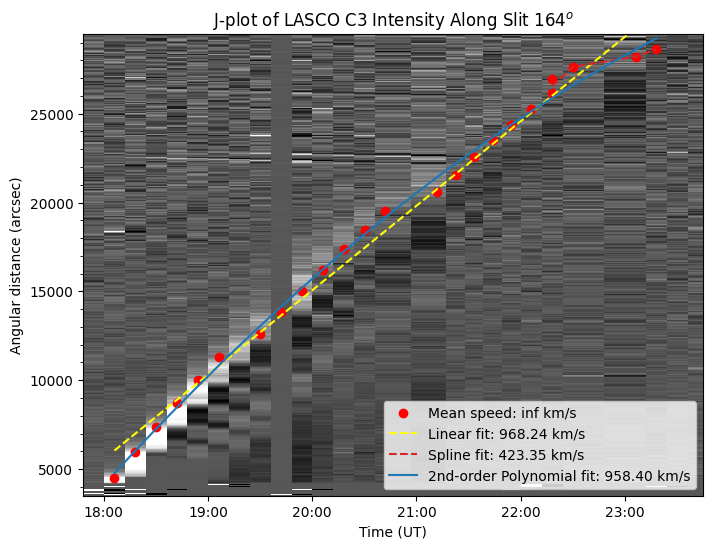

[19857.75425293 19857.76261162 19857.77092286 19857.77926652
 19857.78758701 19857.79592025 19857.81258561 19857.82092111
 19857.82926707 19857.83758641 19857.84592197 19857.85425288
 19857.86259538 19857.88317503 19857.89065176 19857.89805907
 19857.90550691 19857.91293274 19857.92092918 19857.92925315
 19857.92925315 19857.93758638 19857.96268098 19857.97091932]
[ 4617.1049056   6069.53262742  7507.56992916  8890.73053787
 10218.94457443 11546.31748764 12859.03740207 14130.33219262
 15332.93275896 16534.50566842 17694.65135642 18826.48886687
 19916.9622957  21006.32710024 22027.32512419 23007.09526146
 23972.33581791 24883.01138229 25792.71310479 26648.00705144
 27435.60363226 28009.1783894  28462.36316803 28795.37317985]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


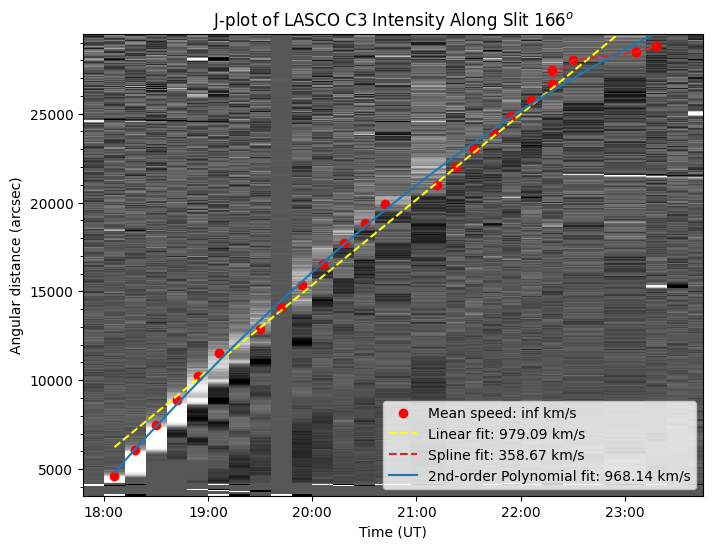

In [25]:
for angle in centered_list:
    
    df = jmaps_coords_list[f'{angle}'][0].copy()

    height = output_obj[f'distances_{angle}deg'][0].copy()
    intens = output_obj[f'intensity_{angle}deg'][0].copy()
    
    # Extract time and distance arrays from the selected coordinates
    x_coords = df['x_coords'].astype('int')
    times_num = np.array(datenum_arr)[x_coords]
    df['time'] = times_num
    
    y_coords = df['y_coords']
    y_coords = round(y_coords).astype('int')
    distances = height[y_coords] # in arcsec
    df['distance'] = distances

    print(f'{times_num}\n{distances}\n\n')
    
    # Perform linear regression to fit a line
    slope, intercept, r_value, p_value, std_err = stats.linregress(times_num, distances)
    
    # get the radius of the solar disk
    sol_rad = const.equatorial_radius.to(u.km)
    
    # conversion factor from arcsec to km
    conversion_factor = sol_rad/output_obj['map_obj'][0].rsun_obs
    
    # convert distance from arcsec to km
    df['distance_km'] = df['distance'] * conversion_factor.value
    
    # calculate the distance difference in km
    df['distance_diff_km'] = df['distance_km'].diff()
    
    # convert time to datetime format
    df['datetime'] = [mdates.num2date(t) for t in df['time']]
    
    # calculate the time difference in seconds
    df['time_diff_s'] = df['datetime'].diff().dt.total_seconds()
    
    # calculate the speed in km/s
    df['speed_km_s'] = df['distance_diff_km'] / df['time_diff_s']

    # export data
    event_date = str(mdates.num2date(times_num[0]).date()).replace('-','')
    df.to_csv(f'{savedir}/jplots/lasco_{detector}/bezier/jmap_lasco_{detector}_{event_date}_slit_{angle}.csv')
    
    # # drop the first row which will have NaN values for the differences
    # df.dropna(inplace=True)
    
    # Calculate spline fit
    spline = UnivariateSpline(times_num, distances, k=1, s=None)  # s=0 for interpolation through all points
    
    # Generate the spline line
    spline_times = np.linspace(min(times_num), max(times_num), 1000)
    spline_distances = spline(spline_times)
    
    # Calculate the derivative of spline_distances with respect to spline_times
    spline_velocity = spline.derivative()(spline_times)
    
    # Convert velocity (in arcsec/day) to speed in km/s
    # 1 arcsec ≈ 733 km on the Sun's surface
    # 1 day = 86400 seconds
    speed_spline = spline_velocity * conversion_factor.value / 86400  # km/s
    
    # Calculate the polynomial fit
    polyfit_coeff = np.polyfit(times_num, distances, 2)  # Fit a 2nd order polynomial
    polyfit_line = np.polyval(polyfit_coeff, spline_times)
    
    # Calculate the derivative of the polynomial fit (velocity)
    polyfit_velocity = np.polyval(np.polyder(polyfit_coeff), spline_times)
    speed_polyfit = polyfit_velocity * conversion_factor.value / 86400  # km/s
    
    # plots the fitting lines
    fig = plt.figure(figsize=[8,6])
    ax = fig.add_subplot(111)
    ax.pcolormesh(datenum_arr, height, intens, vmin=0.7, vmax=1.8, cmap='Greys_r')
    
    # Plot the fitted line
    fit_line = slope*times_num + intercept
    
    # Calculate the speed (slope in arcsec/day to speed in km/s)
    # 1 arcsec ≈ 733 km on the Sun's surface
    # 1 day = 86400 seconds
    speed_fit = slope * conversion_factor.value/86400  # km/s
    speed = df['speed_km_s'].mean()
    
    # Plot the selected points
    ax.plot(times_num, distances, 'ro', label=f'Mean speed: {speed:.2f} km/s')
    ax.plot(times_num, fit_line, ls='--', color='yellow',
            label=f'Linear fit: {speed_fit:.2f} km/s')
    
    # Plot the spline fit line
    ax.plot(spline_times, spline_distances, ls='--', color='tab:red',
            label=f'Spline fit: {np.nanmean(speed_spline):.2f} km/s')
    
    # Plot the polynomial fit line
    ax.plot(spline_times, polyfit_line, ls='-', color='tab:blue',
               label=f'2nd-order Polynomial fit: {np.nanmean(speed_polyfit):.2f} km/s')
    
    ax.set_xlabel('Time (UT)')
    ax.set_ylabel('Angular distance (arcsec)')
    ax.set_title(f"J-plot of {output_obj['instrument'][0].replace('_',' ')} Intensity Along Slit {angle}$^o$")
    ax.xaxis_date()
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    ax.yaxis.set_minor_locator(AutoMinorLocator(n=5))
    ax.legend(loc='lower right')
    ax.set_xlim(right=pd.Timestamp(f"{output_obj['time'][0].split(' ')[0]} 23:45:00"))
    ax.set_ylim(bottom=3500, top=29500)
    fig.savefig(f'{savedir}/jplots/lasco_{detector}/bezier/jmap_lasco_{detector}_{event_date}_slit_{angle}.png', dpi=300, format='png', bbox_inches='tight')
    plt.show()